In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import matplotlib.colors as mcolors

import sys
import scipy.stats as stats
import scipy.optimize as opt
from scipy.spatial import ConvexHull
from scipy.spatial.distance import pdist, squareform


from sklearn.decomposition import PCA
import os

import pyarrow as pa
import pyarrow.parquet as pq

from enum import Enum

from matplotlib.backends.backend_pdf import PdfPages 
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
# 30 sec

In [39]:
sys.path.append('/groups/icecube/cyan/Utils')
from PlotUtils import setMplParam, getColour, getHistoParam 
from ExternalFunctions import nice_string_output, add_text_to_ax
setMplParam()

In [40]:
# Now import from Enum
sys.path.append('/groups/icecube/cyan/factory/DOMification')
from Enum.Flavour import Flavour
from Enum.EnergyRange import EnergyRange
from EventPeek.PseudoNormaliser import PseudoNormaliser

In [41]:
root_dir_noCR = "/lustre/hpc/project/icecube/HE_Nu_Aske_Oct2024/PMTfied_filtered/Snowstorm/PureNu/"
root_dir_noCR_CC = "/lustre/hpc/project/icecube/HE_Nu_Aske_Oct2024/PMTfied_filtered/Snowstorm/CC_CRclean/"
root_dir_noCR_CC_IN = "/lustre/hpc/project/icecube/HE_Nu_Aske_Oct2024/PMTfied_filtered/Snowstorm/CC_CRclean_Contained/"

In [42]:
Flavour.E.latex

'\\nu_e'

In [43]:
EnergyRange.ER_10_TEV_1_PEV.E

'22014'

In [44]:
EnergyRange.ER_10_TEV_1_PEV.latex

'$10\\,\\text{TeV} - 1\\,\\text{PeV}$'

In [45]:
dir_noCR_CC_IN_nu_e_10TeV_1PeV = os.path.join(root_dir_noCR_CC_IN, EnergyRange.ER_10_TEV_1_PEV.E)


In [46]:
dir_noCR_CC_IN_nu_e_10TeV_1PeV

'/lustre/hpc/project/icecube/HE_Nu_Aske_Oct2024/PMTfied_filtered/Snowstorm/CC_CRclean_Contained/22014'

In [47]:
files = [f for f in os.listdir(dir_noCR_CC_IN_nu_e_10TeV_1PeV) if f.endswith(".parquet")]
directories = [d for d in os.listdir(dir_noCR_CC_IN_nu_e_10TeV_1PeV) if os.path.isdir(os.path.join(dir_noCR_CC_IN_nu_e_10TeV_1PeV, d))]

In [48]:
files

['truth_3.parquet',
 'truth_2.parquet',
 'truth_6.parquet',
 'truth_4.parquet',
 'truth_1.parquet',
 'truth_5.parquet']

In [49]:
directories

['6', '1', '5', '2', '3', '4']

In [50]:
pmtfiles = [f for f in os.listdir(os.path.join(dir_noCR_CC_IN_nu_e_10TeV_1PeV, directories[0])) if f.endswith(".parquet")]

In [51]:
pmtfiles

['PMTfied_2.parquet', 'PMTfied_1.parquet']

In [52]:
def linear(x, coeff, offset):
    return coeff*x + offset

In [53]:
def get_energy_distribution_from_truth_file(truth_file: str, title: str = None):
    truth_df = pq.read_table(truth_file).to_pandas()
    energies = truth_df["energy"]

    Nbins, binwidth, bins, counts, bin_centers = getHistoParam(energies, Nbins=50, isLog=True)

    valid_mask = counts > 0  # Avoid log(0) errors
    log_x = np.log10(bin_centers[valid_mask])
    log_y = np.log10(counts[valid_mask])
    
    # **Poisson errors (standard deviation) for log(y)**
    sigma = 1 / np.sqrt(counts[valid_mask])

    popt, pcov = opt.curve_fit(linear, log_x, log_y, sigma=sigma, absolute_sigma=True)# returns optimal parameters and covariance matrix
    slope, intercept = popt

    log_y_fit = linear(log_x, *popt)
    
    # **Compute χ², DOF, and p-value**
    residuals = (log_y - log_y_fit) / sigma
    chi2_value = np.sum(residuals**2)
    dof = len(log_y) - len(popt)  # Degrees of freedom
    p_value = stats.chi2.sf(chi2_value, dof)  # Compute p-value

    # **Plot Histogram and Fit**
    fig, ax = plt.subplots(figsize=(18, 13))
    ax.hist(energies, bins=bins, histtype='step', lw=2, color=getColour(0), label='Energy distribution')

    # **Plot Fit Line Only for Valid Data**
    y_fit = 10**linear(log_x, *popt)
    ax.plot(10**log_x, y_fit, label=f'Fit: $y = {slope:.2f}x + {intercept:.2f}$', color=getColour(1), linestyle='-')

    ax.legend()
    ax.set_xlabel(r'$\log_{10}(\mathrm{energy})$')
    ax.set_ylabel('Counts')

    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title(fr"{title}")

    # **Summary statistics**
    d = {'N_events': f"{len(energies)}",
         'mean': f"{np.mean(energies):.3e}",
         'std': f"{np.std(energies):.3e}",
         'max': f"{np.max(energies):.3e}",
         'min': f"{np.min(energies):.3e}",
         'slope': f"{slope:.3f}",
         'intercept': f"{intercept:.3f}",
         'χ²': f"{chi2_value:.3f}",
         'DOF': f"{dof}",
         'p-value': f"{p_value:.3f}"}

    add_text_to_ax(0.65, 0.85, nice_string_output(d), ax, fontsize=12)
    return fig, ax


(<Figure size 1800x1300 with 1 Axes>,
 <Axes: title={'center': 'None'}, xlabel='$\\log_{10}(\\mathrm{energy})$', ylabel='Counts'>)

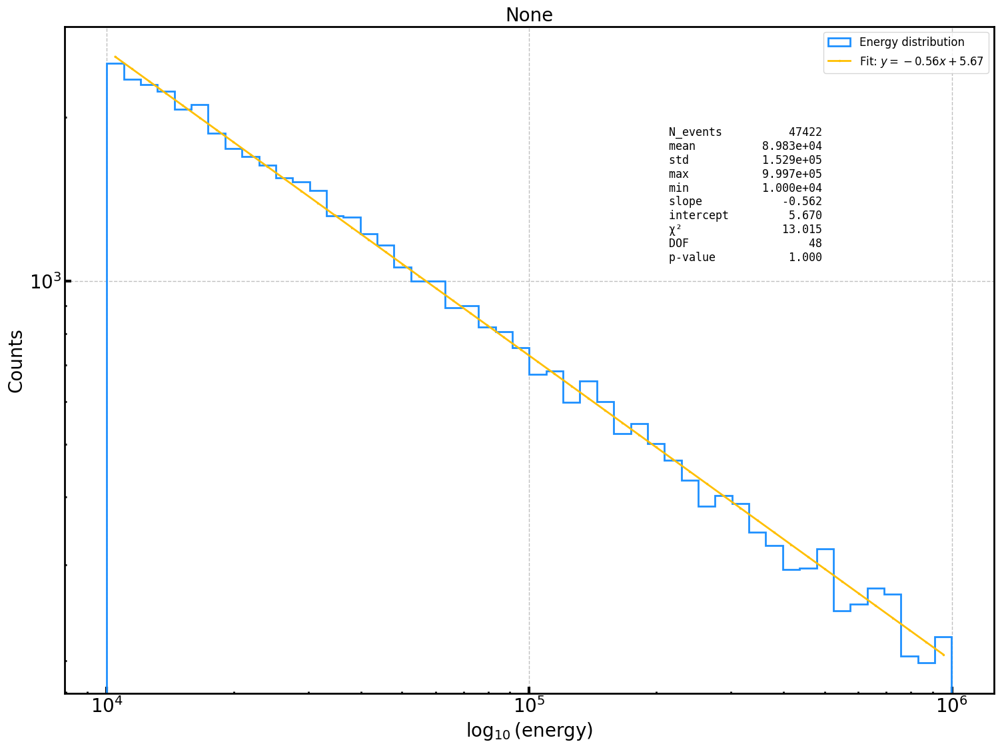

In [54]:
get_energy_distribution_from_truth_file(os.path.join(dir_noCR_CC_IN_nu_e_10TeV_1PeV, files[0]))

In [55]:
def get_interesting_events(truth_file:str, N_doms_cut = 1250):
    truth_df = pq.read_table(truth_file).to_pandas()
    N_doms = truth_df["N_doms"]
    
    interesting_event_no = truth_df[["event_no", "shard_no", "energy"]][N_doms > N_doms_cut]
    return interesting_event_no

In [56]:
get_interesting_events(os.path.join(dir_noCR_CC_IN_nu_e_10TeV_1PeV, files[0]))

,event_no,shard_no,energy
18568,114000300530734,5,700944.500
24216,114000300557416,6,769607.250
24359,114000300558088,6,997287.375
45964,114000300659174,11,649459.250


In [57]:
    def get_normalised_dom_features(pmt_event_df: pd.DataFrame, Q_cut: float = -1) -> pd.DataFrame:
        selected_columns = ["dom_x", "dom_y", "dom_z", "Qtotal", "t1"]
        event_np = pmt_event_df[selected_columns].to_numpy()
        normaliser = PseudoNormaliser()
        
        normalised_np = normaliser(event_np, column_names=selected_columns)
        normalised_df = pd.DataFrame(normalised_np, columns=selected_columns)
        normalised_df[["dom_x", "dom_y", "dom_z"]] = pmt_event_df[["dom_x", "dom_y", "dom_z"]].to_numpy()
        normalised_df = normalised_df[normalised_df["Qtotal"] > Q_cut] if Q_cut is not None else normalised_df

        return normalised_df

In [58]:
def add_string_column_to_event_df(event_df: pd.DataFrame, position_df: pd.DataFrame, tolerance=1.0):
    event_df = event_df.copy()  # Work on a copy to avoid modifying the original DataFrame

    # Create a new 'string' column and initialize it with NaN
    event_df['string'] = np.nan

    # Loop through each DOM in the event_df and find the closest match in position_df
    for idx, row in event_df.iterrows():
        # Calculate distances in x, y (we ignore z here, as it's not relevant for string determination)
        distances = np.sqrt((position_df['dom_x'] - row['dom_x'])**2 + (position_df['dom_y'] - row['dom_y'])**2)
        
        # Find the minimum distance, and check if it is within the tolerance
        min_distance_idx = distances.idxmin()
        if distances[min_distance_idx] <= tolerance:
            # Assign the string number from the reference position
            event_df.at[idx, 'string'] = position_df.at[min_distance_idx, 'string']
    
    return event_df

In [59]:
def get_flavour_ER_subdir_part(event_no: int):
    event_no_str = str(event_no)

    subdir_id = event_no_str[1:3]  # 2-digit subdirectory
    part_no = int(event_no_str[3:7])  # 4-digit part number
    original_event_no = int(event_no_str[7:])  # Remaining digits = event index
    subdir_no = f"220{subdir_id}"
    energy_range = EnergyRange.get_energy_range(subdir_no)
    flavour = EnergyRange.get_flavour(subdir_no)

    return subdir_no, part_no, original_event_no, energy_range, flavour


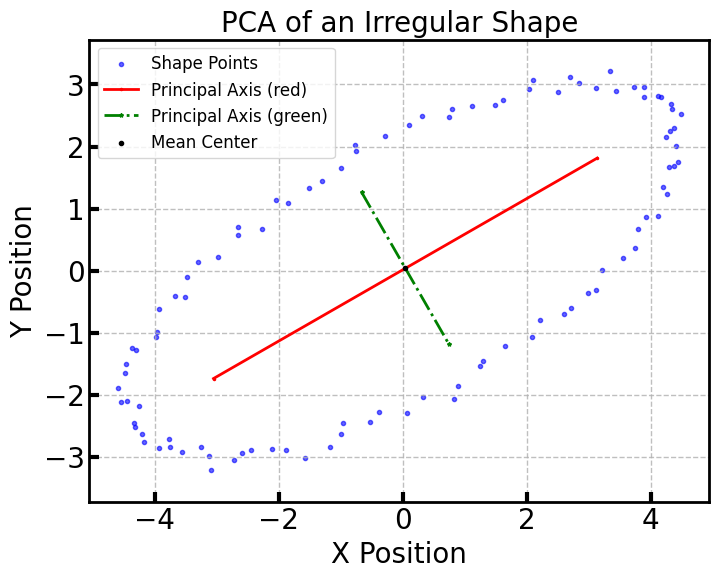

In [60]:
def generate_irregular_shape(n_points=100, noise=0.1, rotation_angle=np.pi/6):
    t = np.linspace(0, 2*np.pi, n_points)  # Parameter for ellipse
    x = 5 * np.cos(t)  # Semi-major axis = 5
    y = 2 * np.sin(t)  # Semi-minor axis = 2
    
    # Add noise
    x += np.random.normal(0, noise, n_points)
    y += np.random.normal(0, noise, n_points)

    # Apply rotation
    R = np.array([[np.cos(rotation_angle), -np.sin(rotation_angle)],
                  [np.sin(rotation_angle), np.cos(rotation_angle)]])
    shape_points = np.dot(R, np.vstack((x, y)))

    return shape_points.T  # Transpose to get shape (n_points, 2)

def custom_PCA(points):
    mean = np.mean(points, axis=0)  # Compute mean
    centered_points = points - mean  # Center the data

    # Compute covariance matrix
    covariance_matrix = np.cov(centered_points, rowvar=False)

    # Compute eigenvalues and eigenvectors
    eigenvalues, eigenvectors = np.linalg.eigh(covariance_matrix)

    # Sort eigenvalues & eigenvectors (largest first)
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]

    # Compute major & minor axis lengths
    major_axis_length = np.sqrt(eigenvalues[0])
    minor_axis_length = np.sqrt(eigenvalues[1])

    return major_axis_length, minor_axis_length, eigenvectors, mean

def plot_shape_with_PCA(points, eigenvectors, mean, major_length, minor_length):
    fig, ax = plt.subplots(figsize=(8, 6))

    # Plot original points
    ax.scatter(points[:, 0], points[:, 1], label="Shape Points", color="blue", alpha=0.6)

    # Plot PCA axes
    for length, vector, color in zip([major_length, minor_length], eigenvectors.T, ["red", "green"]):
        line = np.array([mean - length * vector, mean + length * vector])
        ax.plot(line[:, 0], line[:, 1], color=color, linewidth=2, label=f"Principal Axis ({color})")

    # Annotate
    ax.scatter(mean[0], mean[1], color="black", label="Mean Center", zorder=3)
    ax.legend()
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.set_title("PCA of an Irregular Shape")
    ax.axis("equal")
    plt.show()

def run_understand_PCA():
    # Generate irregular shape
    shape_points = generate_irregular_shape()

    # Compute PCA
    major_length, minor_length, eigenvectors, mean = custom_PCA(shape_points)

    # Plot
    plot_shape_with_PCA(shape_points, eigenvectors, mean, major_length, minor_length)
run_understand_PCA()

In [61]:
def calculate_horizontal_PCA(strings_df: pd.DataFrame):
    xy_points = strings_df[['dom_x', 'dom_y']].to_numpy()

    # Extract the outermost boundary points using Convex Hull
    hull = ConvexHull(xy_points)
    boundary_points = xy_points[hull.vertices]  

    # Compute the mean (centre) of the shape
    centre = np.mean(boundary_points, axis=0)

    # Perform PCA to find the principal axes
    pca = PCA(n_components=2)
    pca.fit(boundary_points)

    # Extract eigenvalues and eigenvectors
    eigenvalues = pca.explained_variance_
    eigenvectors = pca.components_

    # Compute major and minor axis lengths (sqrt of eigenvalues)
    major_axis_length, minor_axis_length = np.sqrt(eigenvalues)

    return major_axis_length, minor_axis_length, eigenvectors, centre, boundary_points

In [62]:
def compute_max_extent(boundary_points):
    """
    Compute the longest pairwise distance between boundary points.
    
    Args:
    boundary_points (np.ndarray): Array of (x, y) coordinates from Convex Hull.

    Returns:
    tuple: (point1, point2, max_distance)
    """
    dist_matrix = squareform(pdist(boundary_points))  # Compute all pairwise distances
    i, j = np.unravel_index(np.argmax(dist_matrix), dist_matrix.shape)  # Find indices of max distance
    point1, point2 = boundary_points[i], boundary_points[j]
    
    return point1, point2, dist_matrix[i, j]

In [100]:
import networkx as nx
import numpy as np
import pandas as pd
from scipy.spatial import distance_matrix

def detect_signal_bundles_adaptive(strings_df: pd.DataFrame, local_factor=1.5):
    """
    Improved signal bundle detection using an adaptive graph-based method.

    Args:
    strings_df (pd.DataFrame): DataFrame with 'dom_x', 'dom_y', 'Qtotal' columns.
    local_factor (float): Scaling factor for local distance thresholding.

    Returns:
    tuple: (num_bundles, bundle_labels, cluster_centroids)
    """
    xy_points = strings_df[['dom_x', 'dom_y']].to_numpy()
    q_total = strings_df["Qtotal"].to_numpy()  # Use Qtotal as weight for centroid calculation

    # Compute pairwise distance matrix
    dist_matrix = distance_matrix(xy_points, xy_points)

    # Compute local nearest-neighbour distances per point
    nearest_distances = np.sort(dist_matrix, axis=1)[:, 1:4]  # Ignore self-distance (first column)
    local_thresholds = np.median(nearest_distances, axis=1) * local_factor  # Adaptive threshold per point

    # Create graph and add edges with adaptive thresholds
    G = nx.Graph()
    for i in range(len(xy_points)):
        G.add_node(i)
        for j in range(i+1, len(xy_points)):
            if dist_matrix[i, j] < min(local_thresholds[i], local_thresholds[j]):  # Use local adaptive threshold
                G.add_edge(i, j, weight=dist_matrix[i, j])

    # Find connected components (bundles)
    components = list(nx.connected_components(G))
    num_bundles = len(components)

    # Assign cluster labels
    bundle_labels = np.zeros(len(xy_points), dtype=int)
    for bundle_id, nodes in enumerate(components):
        for node in nodes:
            bundle_labels[node] = bundle_id

    # Compute centroids (weighted by Qtotal for importance)
    cluster_centroids = []
    for bundle_id, nodes in enumerate(components):
        cluster_points = xy_points[list(nodes)]
        cluster_weights = q_total[list(nodes)]  # Weight by Qtotal
        centroid = np.average(cluster_points, axis=0, weights=cluster_weights)  # Weighted centroid
        cluster_centroids.append(centroid)

    return num_bundles, bundle_labels, np.array(cluster_centroids)


In [101]:
def calculate_vertical_stretch(strings_df: pd.DataFrame):
    stretch_per_string = strings_df.groupby("string")["dom_z"].agg(lambda x: x.max() - x.min())

    # Get the string with the **mean vertical stretch** closest to the mean
    mean_z_stretch = stretch_per_string.mean()
    max_z_stretch = stretch_per_string.max()

    mean_string = (stretch_per_string - mean_z_stretch).abs().idxmin()  # String closest to mean stretch
    max_string = stretch_per_string.idxmax()  # String with max stretch

    # Get Z min/max positions for the selected strings
    mean_z_positions = strings_df.loc[strings_df["string"] == mean_string, "dom_z"].agg(["min", "max"]).values
    max_z_positions = strings_df.loc[strings_df["string"] == max_string, "dom_z"].agg(["min", "max"]).values

    return mean_z_stretch, max_z_stretch, mean_z_positions, max_z_positions


In [ ]:
def plot_DOM_heatmap_for_this_event(pmt_event_df: pd.DataFrame, shard_no:int, energy:int, Q_cut:int = -1, elev=45, azim=105):
    position_file = "/groups/icecube/cyan/factory/DOMification/dom_ref_pos/unique_string_dom_completed.csv"
    position_df = pd.read_csv(position_file)

    # Normalise the event DataFrame
    pseudo_normalised_df = get_normalised_dom_features(pmt_event_df, Q_cut)
    pseudo_normalised_df = add_string_column_to_event_df(pseudo_normalised_df, position_df)
    
    
    # Create figure and 3D axis
    fig, ax = plt.subplots(figsize=(18, 13), subplot_kw={'projection': '3d'})
    # **Plot reference DOM positions as small grey dots (background)**
    ax.scatter(
        position_df["dom_x"], position_df["dom_y"], position_df["dom_z"],
        color=getColour(1), marker=".", s=10, label="Reference DOMs", zorder=1
    )

    # ✅ Apply Qtotal cutoff **before** computing statistics
    major_axis_length, minor_axis_length, eigenvectors, centre, border_xy = calculate_horizontal_PCA(pseudo_normalised_df)
    xy_end1, xy_end2, max_extent_2d = compute_max_extent(border_xy)
    num_bundles, bundle_labels, cluster_centroids = detect_signal_bundles(pseudo_normalised_df)
    mean_z_stretch, max_z_stretch, mean_z_positions, max_z_positions = calculate_vertical_stretch(pseudo_normalised_df)
    # Extract relevant columns
    dom_x = pseudo_normalised_df["dom_x"]
    dom_y = pseudo_normalised_df["dom_y"]
    dom_z = pseudo_normalised_df["dom_z"]
    Qtotal = pseudo_normalised_df["Qtotal"]
    t1 = pseudo_normalised_df["t1"]

    # Marker size scaling
    min_marker_size, max_marker_size = 10, 200
    Qmin, Qmax = Qtotal.min(), Qtotal.max()
    marker_sizes = min_marker_size + (Qtotal - Qmin) / (Qmax - Qmin) * (max_marker_size - min_marker_size)

    # Normalise arrival time for colormap
    t_norm = mcolors.Normalize(vmin=t1.min(), vmax=t1.max())

    # **Plot event scatter points (foreground)**
    sc = ax.scatter(dom_x, dom_y, dom_z, c=t1, cmap="cool", norm=t_norm,
                    s=marker_sizes, alpha=0.8, edgecolors='black', linewidth=0.5, zorder=2)

    # Colorbar for arrival time
    cbar = plt.colorbar(sc, ax=ax, pad=0.1, shrink=0.75)
    cbar.set_label("Adjusted Arrival Time (t1)")
    
    # **String labels**
    TEXT_Z = 600
    for string in pseudo_normalised_df['string'].unique():
        string_df = pseudo_normalised_df[pseudo_normalised_df['string'] == string]
        ax.text(string_df['dom_x'].iloc[0], string_df['dom_y'].iloc[0], TEXT_Z,
                f'{int(string)}', fontsize=10, ha='center', color='black')
    
    # **PCA axes**
    major_axis_endpoints = np.array([
        centre[:2] - major_axis_length * eigenvectors[0],
        centre[:2] + major_axis_length * eigenvectors[0]
    ])
    minor_axis_endpoints = np.array([
        centre[:2] - minor_axis_length * eigenvectors[1],
        centre[:2] + minor_axis_length * eigenvectors[1]
    ])
    major_axis_3d = np.column_stack((major_axis_endpoints, np.full(2, TEXT_Z)))
    minor_axis_3d = np.column_stack((minor_axis_endpoints, np.full(2, TEXT_Z)))
    ax.plot(major_axis_3d[:, 0], major_axis_3d[:, 1], major_axis_3d[:, 2], color=getColour(2), linewidth=3, label="PCA XY major")
    ax.plot(minor_axis_3d[:, 0], minor_axis_3d[:, 1], minor_axis_3d[:, 2], color=getColour(3), linewidth=3, label="PCA XY minor")

    # **Max extent line**
    max_extent_3d = np.array([
        [xy_end1[0], xy_end1[1], TEXT_Z],
        [xy_end2[0], xy_end2[1], TEXT_Z]
    ])
    ax.plot(max_extent_3d[:, 0], max_extent_3d[:, 1], max_extent_3d[:, 2], 
            color=getColour(0), linewidth=3, linestyle="dashed", label="Max XY extent")

    # Minimum Spanning Tree (Signal Bundles)
    # for bundle_id in range(num_bundles):
    #     bundle_points = pseudo_normalised_df[bundle_labels == bundle_id]
    #     ax.scatter(bundle_points['dom_x'], bundle_points['dom_y'], bundle_points['dom_z'], 
    #             label=f"Bundle {bundle_id+1}", s=30, alpha=0.8)

    # Plot centroids
    ax.scatter(cluster_centroids[:, 0], cluster_centroids[:, 1], TEXT_Z, 
            color="red", marker="X", s=200, label="Bundle Centroids")
    
    # **Z Stretch lines**
    z_mean_at_this_xy = (575, 475)
    z_max_at_this_xy = (625, 525)
    ax.plot([z_mean_at_this_xy[0], z_mean_at_this_xy[0]], [z_mean_at_this_xy[1], z_mean_at_this_xy[1]], mean_z_positions, 
            color=getColour(5), linewidth=3, label="Mean Z Stretch")

    ax.plot([z_max_at_this_xy[0], z_max_at_this_xy[0]], [z_max_at_this_xy[1], z_max_at_this_xy[1]], max_z_positions, 
            color=getColour(8), linewidth=3,  label="Max Z Stretch")
    
    # Create top boundary polygon (XY Boundary)
    verts_top = [np.column_stack((border_xy[:, 0], border_xy[:, 1], np.full(border_xy.shape[0], TEXT_Z)))]
    ax.add_collection3d(Poly3DCollection(verts_top, facecolors=getColour(6), alpha=0.2, label='XY Boundary (Top)'))
    
    for x, y in border_xy:
        ax.plot([x, x], [y, y], TEXT_Z, color=getColour(6), alpha=0.5)
    ax.legend()
        
    
    # **Create a marker size legend**
    size_legend_values = np.linspace(Qmin, Qmax, num=4)
    size_legend_markers = min_marker_size + (size_legend_values - Qmin) / (Qmax - Qmin) * (max_marker_size - min_marker_size)

    # Position the legend outside the plot
    legend_ax = fig.add_axes([0.85, 0.15, 0.075, 0.1])  # [left, bottom, width, height]
    legend_ax.set_xticks([])
    legend_ax.set_yticks([])
    legend_ax.set_title(r"$Q_{\text{adjusted}} = \log_{10}(Q_{\text{total}}) - 2$" + "\n" +
                        r"$T_{\text{adjusted}} = (T - 10^4)\times (3\times 10^4)^{-1}$", fontsize=14)

    for size, q in zip(size_legend_markers, size_legend_values):
        legend_ax.scatter([], [], s=size, edgecolors='black', facecolors='none', label=f"{q:.2f}")

    legend_ax.legend(loc="center", frameon=False, fontsize=10)

    # **Statistics Dictionary**
    event_no = pmt_event_df["event_no"].iloc[0]
    subdir_no, part_no, original_event_no, energy_range, flavour = get_flavour_ER_subdir_part(event_no)
    
    d_class = {
        "event_no": f"{original_event_no}",
        "part, shard": f"{part_no}, {int(shard_no)}",
        "PCA XY major": f"{major_axis_length:.3f}",
        "PCA XY minor": f"{minor_axis_length:.3f}",
        "max XY extent": f"{max_extent_2d:.3f}",
        "mean Z stretch": f"{mean_z_stretch:.3f}",
        "max Z stretch": f"{max_z_stretch:.3f}",
    }
    
    original_Qtot = pmt_event_df["Qtotal"]
    original_t1 = pmt_event_df["t1"]
    N_dom_original = len(pmt_event_df)
    d_original_event = {
        "original values": "",
        "N_doms": f"{N_dom_original}",
        "Q max": f"{original_Qtot.max():.3f}",
        "Q mean": f"{original_Qtot.mean():.3f}",
        "Q median": f"{original_Qtot.median():.3f}",
        "t1 max": f"{original_t1.max():.3f}",
        "t1 min": f"{original_t1.min():.3f}",
        "t1 mean": f"{original_t1.mean():.3f}",
        "t1 median": f"{original_t1.median():.3f}",
    }
    N_dom_cut = len(pseudo_normalised_df)
    d_pseudo_normalised = {
        "adjusted values": "",
        f"N_DOM(Q>{Q_cut})": f"{N_dom_cut}({N_dom_cut/N_dom_original:.2f})",  # ✅ Uses filtered DataFrame
        f"Q max": f"{Qtotal.max():.3f}",
        f"Q mean": f"{Qtotal.mean():.3f}",
        f"Q median": f"{Qtotal.median():.3f}",
        f"t1 max": f"{t1.max():.3f}",
        f"t1 min": f"{t1.min():.3f}",
        f"t1 mean": f"{t1.mean():.3f}",
        f"t1 median": f"{t1.median():.3f}",
    }

    # ✅ Add text using fig.text() to ensure correct positioning
    fig.text(0.15, 0.80, nice_string_output(d_class), fontsize=12, family='monospace', verticalalignment='top', color='black')
    fig.text(0.15, 0.20, nice_string_output(d_original_event), fontsize=12, family='monospace', verticalalignment='top', color='black')
    fig.text(0.62, 0.25, nice_string_output(d_pseudo_normalised), fontsize=12, family='monospace', verticalalignment='top', color='black')

    # **Set plot labels**
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    ax.set_zlabel("Z Position")
    # ax.set_title(r"DOM Positions with $Q_{\text{adjusted}}$ and $t1_{\text{adjusted}}$")
    ax.set_title(f"$Q_{{\\text{{adjusted}}}}$ & $t1_{{\\text{{adjusted}}}}$ of ${flavour.latex}$      ({energy:.3e}GeV)")


    # Adjust viewing angle
    ax.view_init(elev=elev, azim=azim)

    # plt.legend()  # Ensure labels appear
    plt.show()
    
    return fig, ax


In [ ]:
def plot_events_from_this_part(root_before_subdir:str, subdir:str, part: int, N_doms_cut:int = 1250, Q_cut: float = -1):
    subdir_path = os.path.join(root_before_subdir, subdir)
    truth_file = os.path.join(root_before_subdir, subdir, f"truth_{part}.parquet")
    interesting_events = get_interesting_events(truth_file = truth_file, N_doms_cut = N_doms_cut)
    energy_range = EnergyRange.get_energy_range(subdir).latex
    flavour = EnergyRange.get_flavour(subdir).latex
    title_for_energy_spectrum = f"${flavour}$,  {energy_range}   (part {part})"
    # get_energy_distribution_from_truth_file(truth_file, title = title_for_energy_spectrum)
    for event_no, shard_no, energy in interesting_events.values:
        pmt_shard_df = pq.read_table(os.path.join(subdir_path, str(part), f"PMTfied_{int(shard_no)}.parquet")).to_pandas()
        pmt_event_df = pmt_shard_df[pmt_shard_df["event_no"] == event_no]
        plot_DOM_heatmap_for_this_event(pmt_event_df, shard_no, energy, Q_cut)

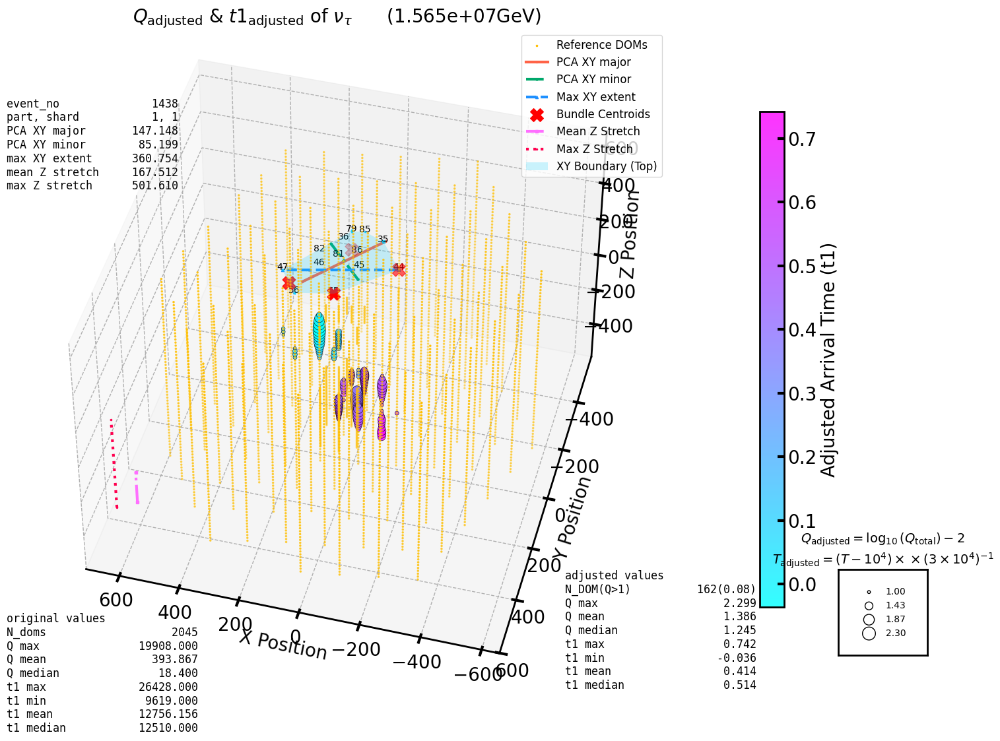

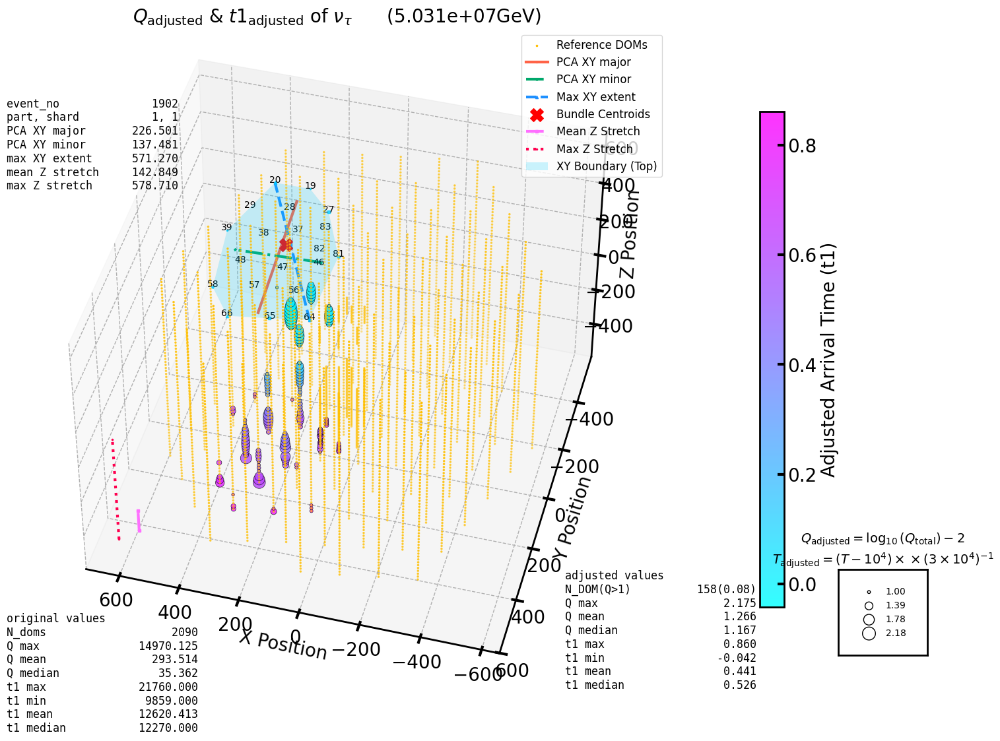

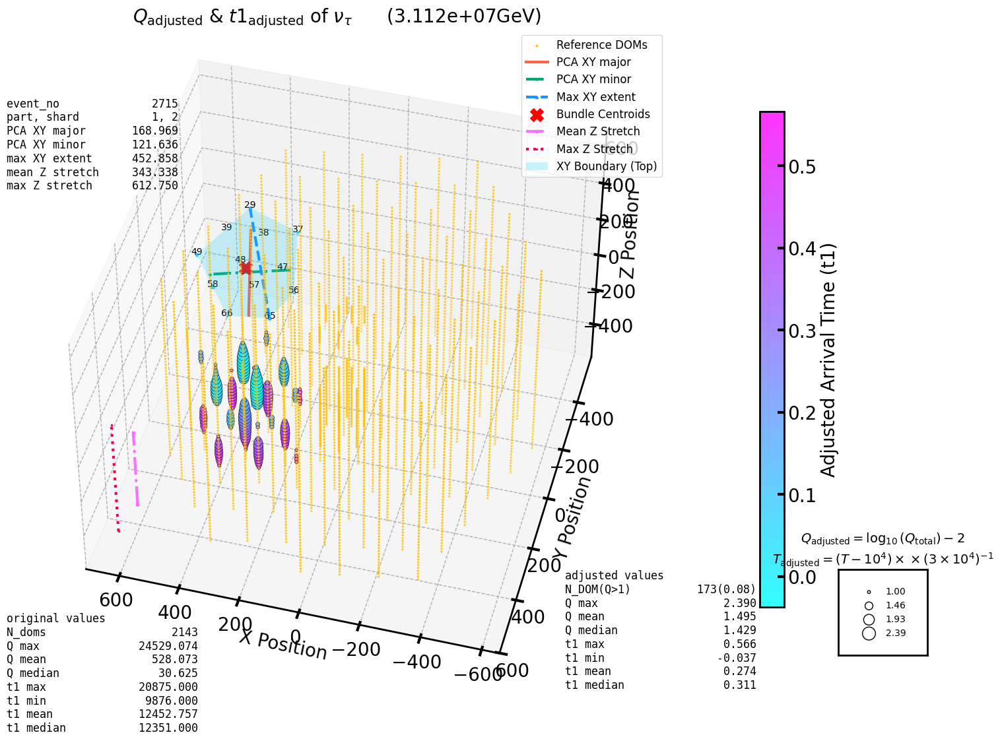

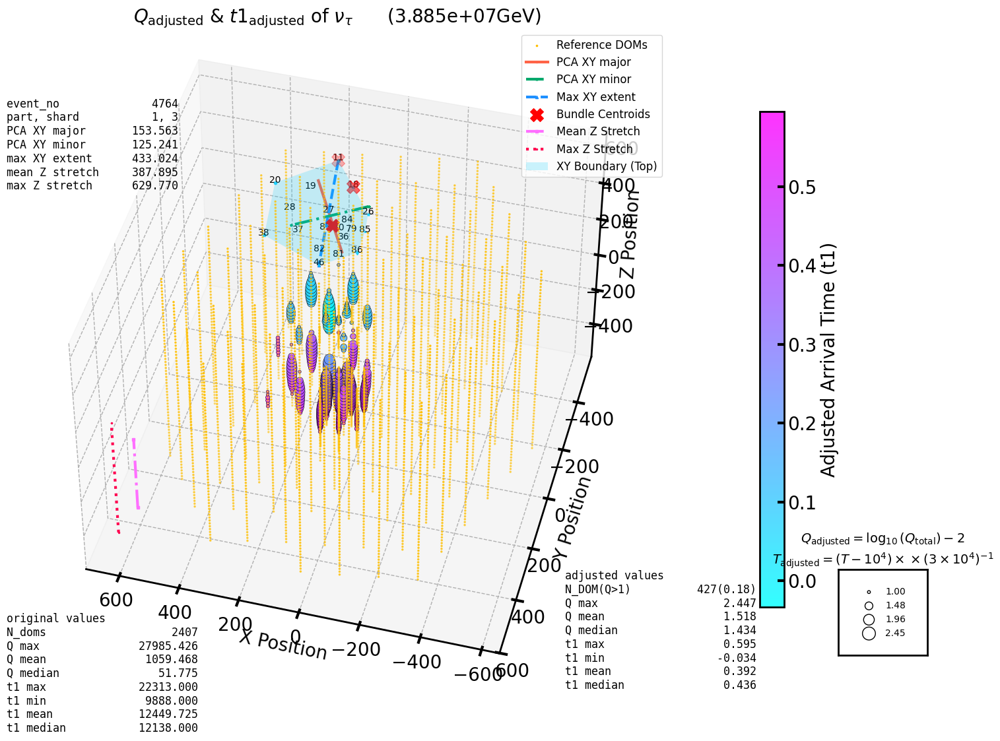

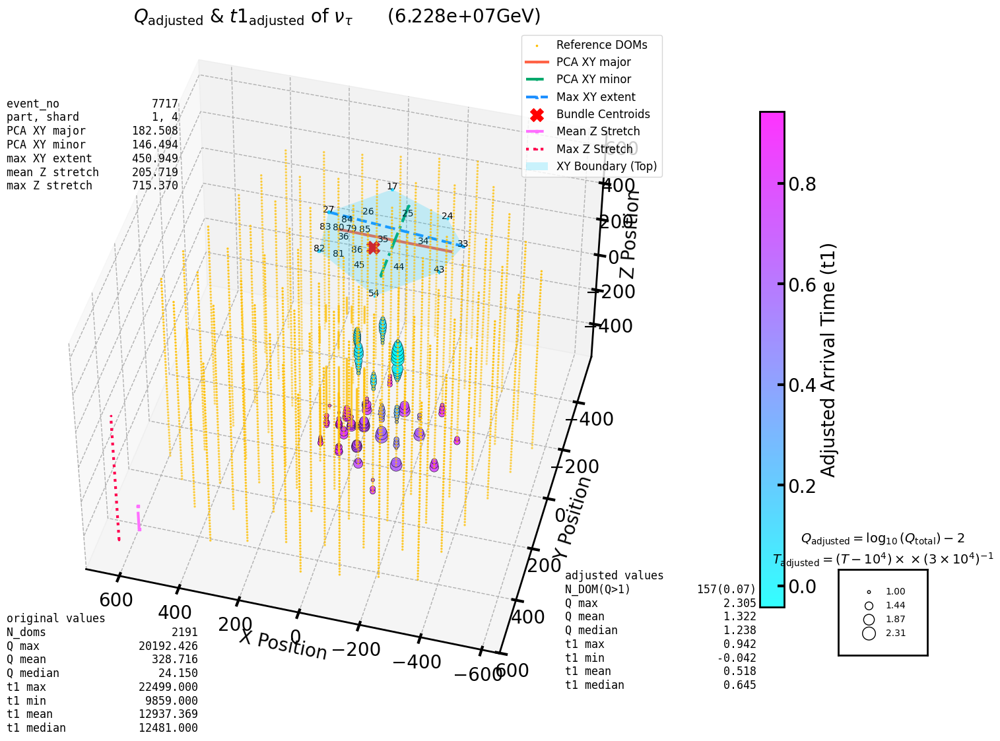

...

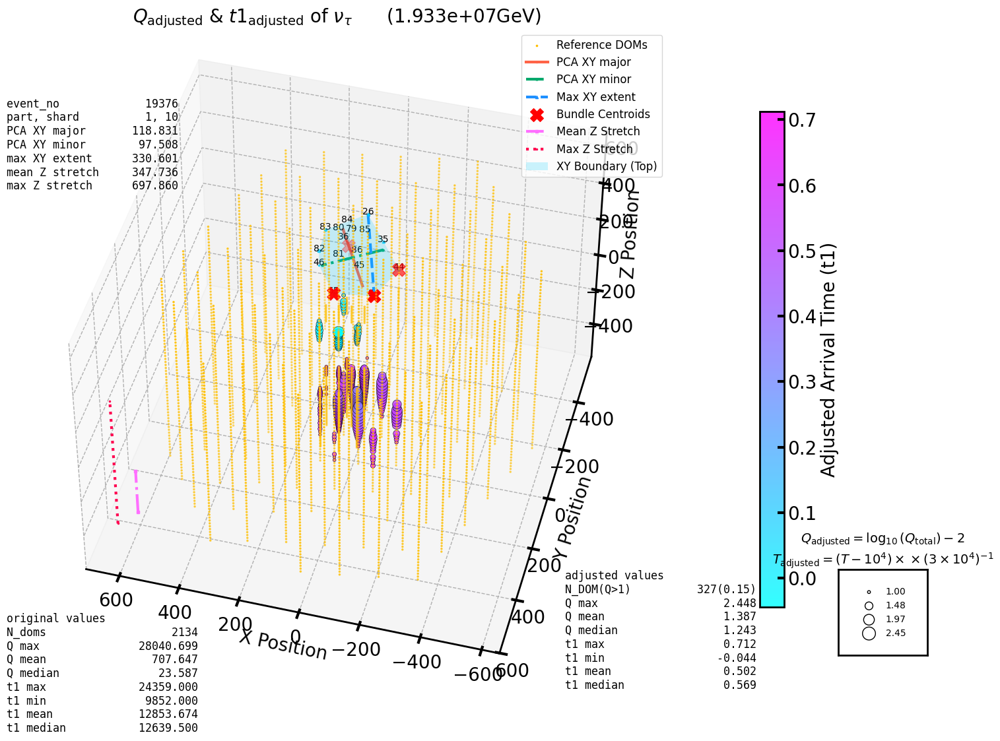

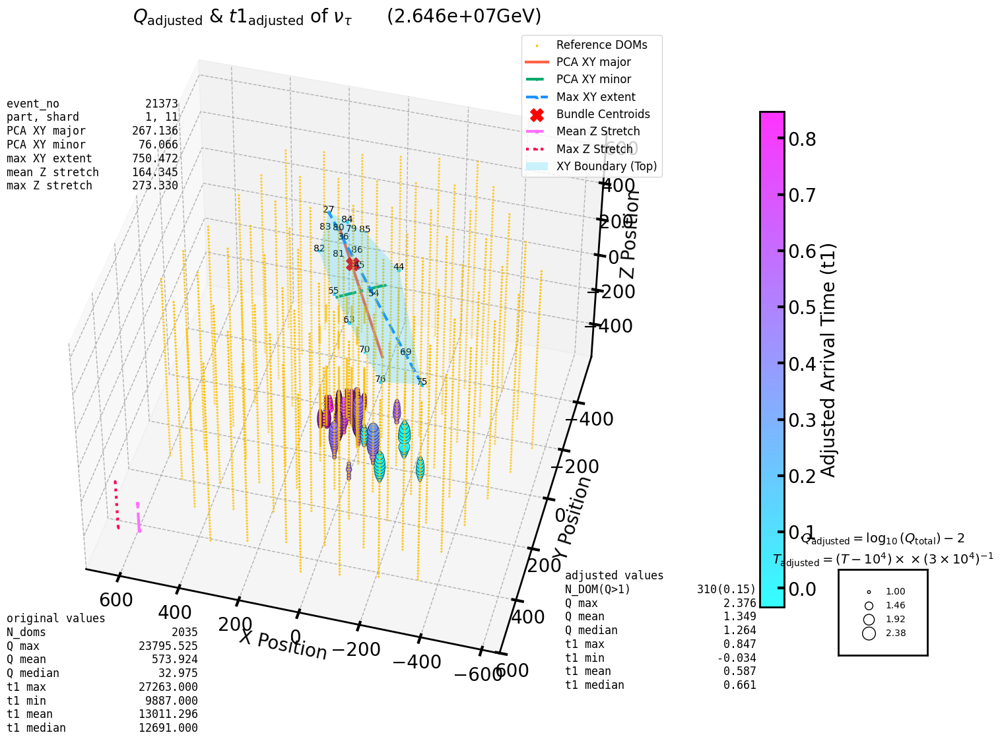

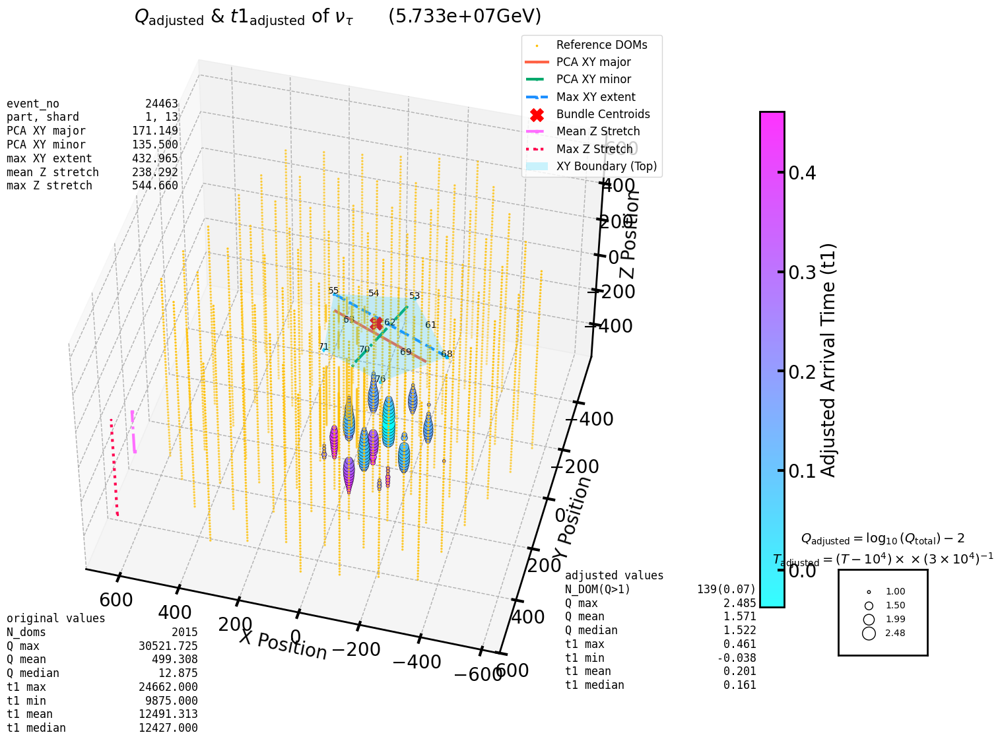

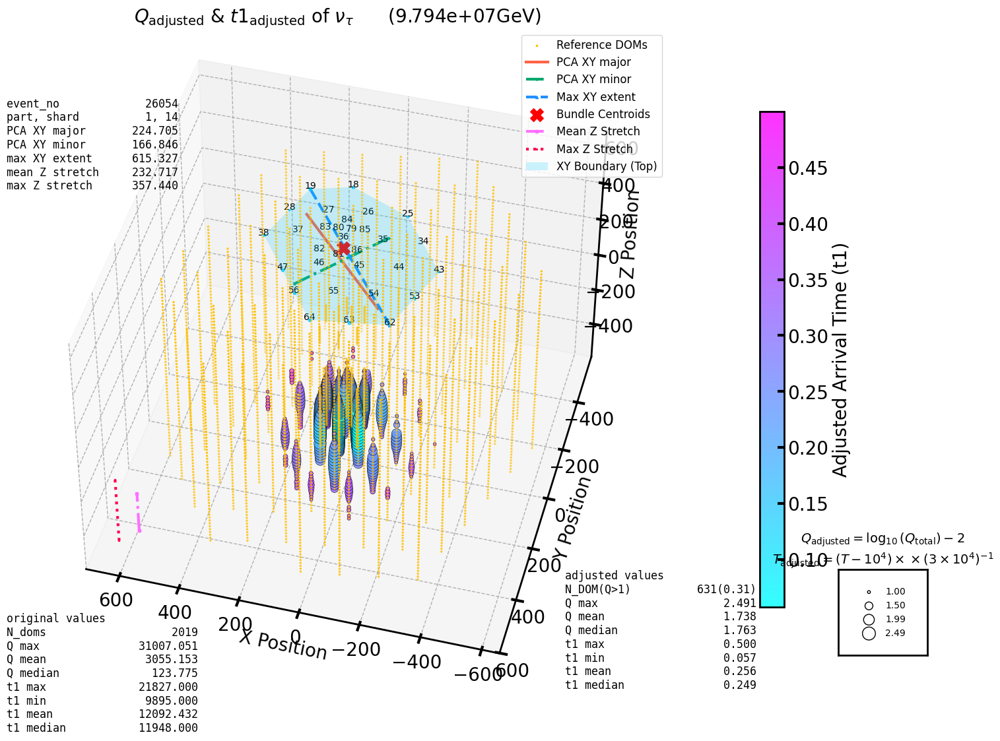

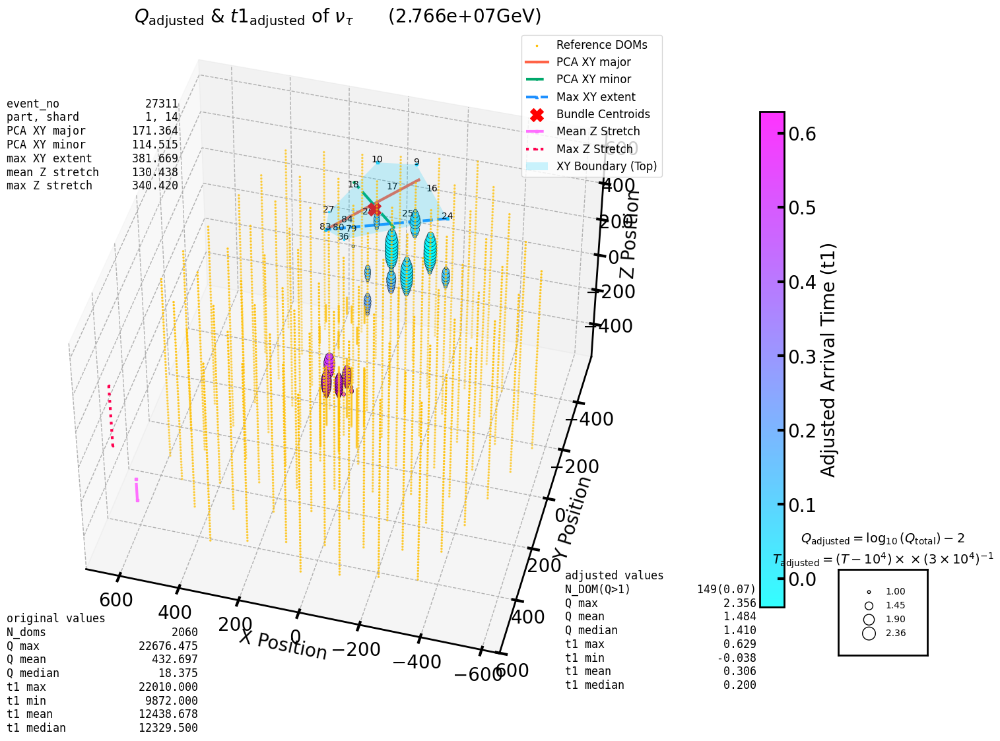

In [ ]:
plot_events_from_this_part(root_dir_noCR_CC_IN, EnergyRange.ER_1_PEV_100_PEV.TAU, 1, 2000, -1)
# 

$$
Q_{\text{shifted}} = \log_{10}(Q) - 2
$$


In [67]:
# def plot_events_from_this_subdir(root_before_subdir:str, subdir:str):
#     subdir_path = os.path.join(root_before_subdir, subdir)
#     files = [f for f in os.listdir(subdir_path) if f.endswith(".parquet")]
#     for file in files:
#         part = int(file.split("_")[-1].split(".")[0])
#         plot_events_from_this_part(root_before_subdir, subdir, part)

In [68]:
# plot_events_from_this_subdir(root_dir_noCR_CC_IN, EnergyRange.ER_10_TEV_1_PEV.E)

In [69]:
def save_plots_to_pdf(root_dir: str, 
                      er: EnergyRange, 
                      flavour: Flavour, 
                      output_pdf_dir:str, 
                      output_pdf_file:str, 
                      N_doms_cut:int = 1250):
    os.makedirs(output_pdf_dir, exist_ok=True)

    output_pdf_path = os.path.join(output_pdf_dir, output_pdf_file)
    subdir = EnergyRange.get_subdir(er, flavour)
    with PdfPages(output_pdf_path) as pdf:
        # Get all events from this subdir
        subdir_path = os.path.join(root_dir, subdir)
        files = [f for f in os.listdir(subdir_path) if f.endswith(".parquet")]
        
        for file in files:
            part = int(file.split("_")[-1].split(".")[0])
            # Process and generate plots for each part
            interesting_events = get_interesting_events(truth_file = os.path.join(subdir_path, file), N_doms_cut=N_doms_cut)
            energy_range = EnergyRange.get_energy_range(subdir).latex
            title_for_energy_spectrum = f"${flavour.latex}$,  {energy_range}   (part {part})"
            
            # Get energy distribution plot
            fig, ax = get_energy_distribution_from_truth_file(os.path.join(subdir_path, file), title=title_for_energy_spectrum)
            pdf.savefig(fig)  # Save the energy distribution plot
            plt.close(fig)  # Close the figure to free memory
            
            for event_no, shard_no, energy in interesting_events.values:
                pmt_shard_df = pq.read_table(os.path.join(subdir_path, str(part), f"PMTfied_{int(shard_no)}.parquet")).to_pandas()
                pmt_event_df = pmt_shard_df[pmt_shard_df["event_no"] == event_no]
                
                # Get DOM heatmap plot
                fig, ax = plot_DOM_heatmap_for_this_event(pmt_event_df, shard_no, energy)
                pdf.savefig(fig)  # Save the DOM heatmap plot
                plt.close(fig)  # Close the figure to free memory


In [70]:
pdf_dir = "/lustre/hpc/icecube/cyan/factory/DOMification/EventPeek/"

In [71]:
# save_plots_to_pdf(root_dir_noCR_CC_IN, EnergyRange.ER_10_TEV_1_PEV, Flavour.TAU, pdf_dir, "EventPeek_nu_tau_10TeV_1PeV.pdf", N_doms_cut=1200)
# 1250: 12 sec
# 1200: 62 sec

In [72]:
# save_plots_to_pdf(root_dir_noCR_CC_IN, EnergyRange.ER_10_TEV_1_PEV, Flavour.E, pdf_dir, "EventPeek_nu_e_10TeV_1PeV.pdf", N_doms_cut=1250)

In [73]:
# save_plots_to_pdf(root_dir_noCR_CC_IN, EnergyRange.ER_10_TEV_1_PEV, Flavour.MU, pdf_dir, "EventPeek_nu_mu_10TeV_1PeV.pdf", N_doms_cut=1250)

### double bang: 
1. first $\nu_{\tau}$ CC interaction
2. $\tau$ decay
* the distance between the two cascades depends on the tau decay length   
[tau decay length $<L_{\tau}> \approx 50 \cdot E_\tau (m/PeV)$](https://arxiv.org/abs/1908.05506)
  * 1 Pev tau decay length is 50 meters
  * 10 Pev tau decay length is 500 meters
  * 100 Pev tau decay length is 5000 meters